In [ ]:
!pip install -U ultralytics
!pip install chardet
!pip install matplotlib

In [2]:
import torch
import os
import random
import cv2
import numpy as np


from glob import glob
from tqdm import tqdm
from collections import defaultdict
from torchvision.datasets import CIFAR100
from PIL import Image
from ultralytics import YOLO


In [3]:
print("CUDA disponível:", torch.cuda.is_available())
print("Dispositivo atual:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(device)


CUDA disponível: True
Dispositivo atual: NVIDIA GeForce RTX 3060
cuda


In [16]:
# Defina os diretórios base para salvar o dataset
base_dir   = "cifar100"
train_dir  = os.path.join(base_dir, "train")
val_dir    = os.path.join(base_dir, "val")

# Parâmetros de processamento
target_size        = (256, 256)   # redimensionar para 256×256
random_seed        = 42
train_per_class    = 400          # quantas imagens por classe para treino
val_per_class      = 80          # quantas imagens por classe para validação
# OBS: train_per_class + val_per_class ≤ 500 (pois cada classe tem 500 imagens em CIFAR-100)

def process_and_save_split(indices, dataset, save_dir):
    os.makedirs(save_dir, exist_ok=True)

    for idx in indices:
        img, label    = dataset[idx]           # img é PIL.Image.Image em RGB
        class_name    = dataset.classes[label]  # exemplo: "apple", "aquarium_fish", etc.

        # Redimensiona mantendo as cores (sem grayscale)
        img_resized = img.resize(target_size, Image.BILINEAR)

        # Cria pasta da classe (se não existir)
        class_dir = os.path.join(save_dir, class_name)
        os.makedirs(class_dir, exist_ok=True)

        # Define nome único
        img_filename = f"{idx:05d}.png"
        img_path     = os.path.join(class_dir, img_filename)

        # Salva em PNG
        img_resized.save(img_path)


# 1. Carregar o CIFAR100 original (split de treino, 50.000 imagens)
dataset = CIFAR100(root="./data", train=True, download=True, transform=None)

# 2. Agrupar índices de cada classe (0 a 49999), pois CIFAR-100 é balanceado (500 imagens por classe)
class_to_indices = defaultdict(list)
for idx, label in enumerate(dataset.targets):  # dataset.targets é lista de rótulos
    class_to_indices[label].append(idx)

# 3. Para cada classe, embaralhar e separar os primeiros train_per_class e val_per_class
train_indices = []
val_indices   = []

random.seed(random_seed)
for label, idx_list in class_to_indices.items():
    # Embaralha em-loco
    random.shuffle(idx_list)

    # Seleciona os primeiros train_per_class para treino
    selected_train = idx_list[:train_per_class]
    # Seleciona os próximos val_per_class para validação
    selected_val   = idx_list[train_per_class: train_per_class + val_per_class]

    # Acumula em lista geral
    train_indices.extend(selected_train)
    val_indices.extend(selected_val)

# 4. Processa e salva (grayscale + resize + organização por classe)
process_and_save_split(train_indices, dataset, train_dir)
print(f"Salvo conjunto de treino: {len(train_indices)} imagens em '{train_dir}'")

process_and_save_split(val_indices, dataset, val_dir)
print(f"Salvo conjunto de validação: {len(val_indices)} imagens em '{val_dir}'")


Salvo conjunto de treino: 40000 imagens em 'cifar100\train'
Salvo conjunto de validação: 8000 imagens em 'cifar100\val'


# Treinamento Modelo YOLOv11 para CIFAR-100

In [ ]:

model = YOLO('yolo11n-cls.pt')
model.train(
    data="cifar100",      
    epochs=200,
    patience = 15,
    imgsz=256,
    batch=64,
    workers=1,
    name='yolov11_cifar100_super'
)

Total de classes elegíveis: 100

🔁 Execução 1/5


Avaliação estatística #1: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.95it/s]



🔁 Execução 2/5


Avaliação estatística #2: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.45it/s]



🔁 Execução 3/5


Avaliação estatística #3: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.54it/s]



🔁 Execução 4/5


Avaliação estatística #4: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.64it/s]



🔁 Execução 5/5


Avaliação estatística #5: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.68it/s]
C:\Users\joao_\AppData\Local\Temp\ipykernel_28084\213241423.py:58: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\joao_\AppData\Local\Temp\ipykernel_28084\213241423.py:58: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()



📊 Resultados numéricos (MÉDIA de 5 execuções):
🔹 Acurácia média por imagem: 89.02% (4006/4500)
✅ Grupos com acerto total da classe-alvo: 66.20% (331/500)
⚠️ Grupos com acerto parcial da classe-alvo: 33.80% (169/500)
❌ Grupos com erro total da classe-alvo: 0.00% (0/500)


C:\Users\joao_\anaconda3\envs\captchaClassification\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


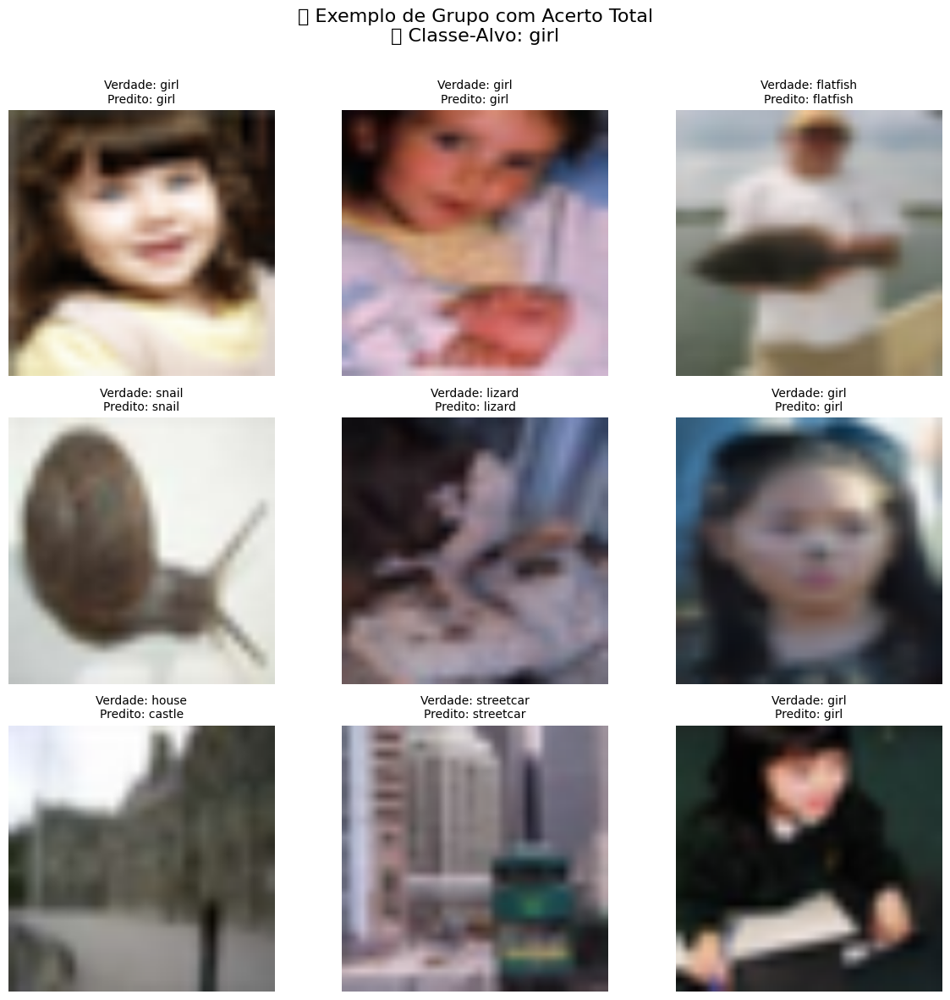

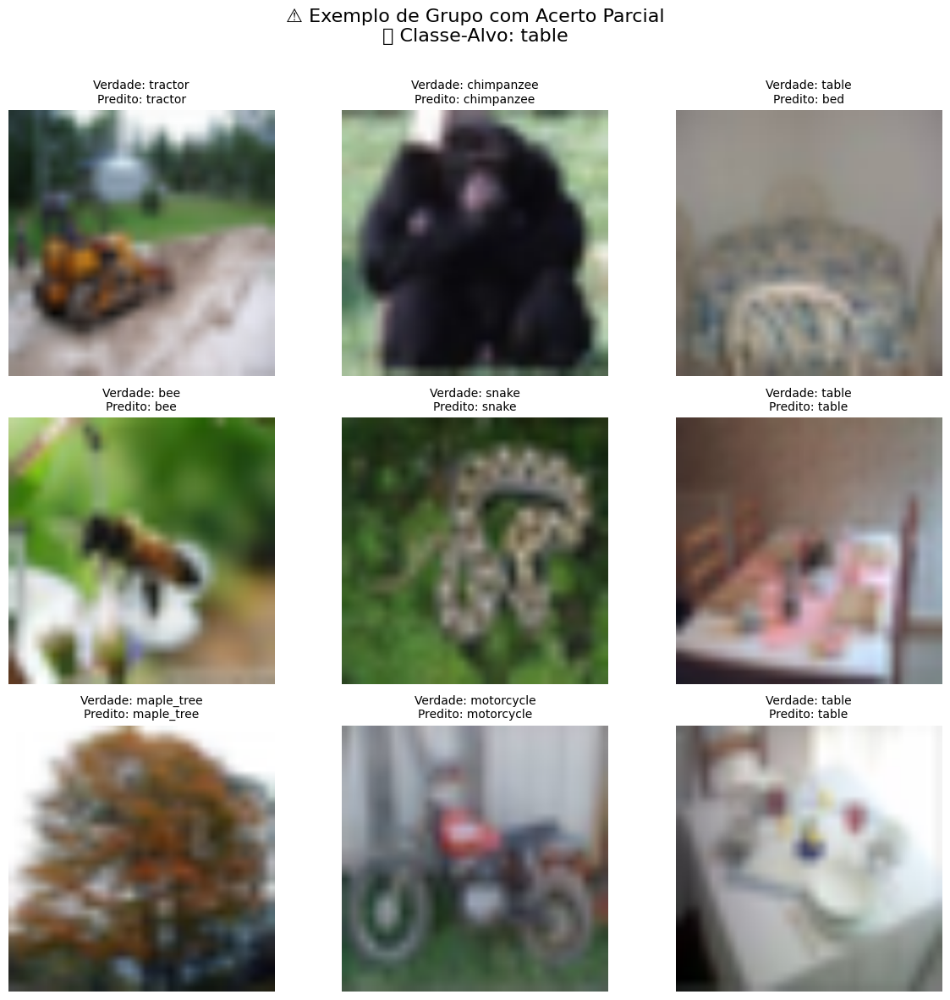

In [11]:
import os
import random
from glob import glob
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
from ultralytics import YOLO

# Novo diretório com imagens aumentadas
base_dir = '../datasets/cifar100/val'

# Caminho para o modelo treinado salvo automaticamente
model_path = '../models/Yolo_Cifar.pt'

# Carregar o modelo
model = YOLO(model_path)

# Gera mapeamento: classe -> lista de imagens
class_to_imgs = {
    cls: glob(os.path.join(base_dir, cls, '*.*'))
    for cls in os.listdir(base_dir)
    if os.path.isdir(os.path.join(base_dir, cls))
}

# Remove classes com menos imagens que o mínimo desejado
min_class_images = 3
max_class_images = 4
eligible_classes = [cls for cls, imgs in class_to_imgs.items() if len(imgs) >= min_class_images]

print(f"Total de classes elegíveis: {len(eligible_classes)}")

# Lista global para armazenar exemplos
grupos_resultados = []

def mostrar_grupo_exemplo(grupo_data, classe_alvo=None, titulo="Grupo de Imagens"):
    """
    Mostra um grid com as imagens do grupo, indicando classe verdadeira e predição.
    Exibe também a classe-alvo do grupo.
    """
    imagens, preds, truths = grupo_data
    cols = 3
    rows = (len(imagens) + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))

    for i, img_path in enumerate(imagens):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(f"Verdade: {truths[i]}\nPredito: {preds[i]}", fontsize=10)
        plt.axis('off')

    suptitle = f"{titulo}"
    if classe_alvo:
        suptitle += f"\n🎯 Classe-Alvo: {classe_alvo}"

    plt.suptitle(suptitle, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)  # Ajuste para não sobrepor título
    plt.show()

def avaliar_grupos(n_execucoes=5, eval_trials=100, group_size=9):
    total_predictions_all = 0
    correct_predictions_all = 0
    total_grupos_all = 0

    acertos_grupo_total_all = 0
    acertos_grupo_parcial_all = 0
    erros_grupo_total_all = 0

    for exec_num in range(n_execucoes):
        print(f"\n🔁 Execução {exec_num + 1}/{n_execucoes}")
        for _ in tqdm(range(eval_trials), desc=f"Avaliação estatística #{exec_num + 1}"):
            chosen_class = random.choice(eligible_classes)
            max_allowed = min(max_class_images, group_size - 1)
            n_class_imgs = random.randint(min_class_images, max_allowed)

            main_class_imgs = random.sample(class_to_imgs[chosen_class], n_class_imgs)
            remaining_imgs = [img for cls, imgs in class_to_imgs.items() if cls != chosen_class for img in imgs if img not in main_class_imgs]
            other_imgs = random.sample(remaining_imgs, group_size - n_class_imgs)

            selected_imgs = main_class_imgs + other_imgs
            random.shuffle(selected_imgs)

            results = model.predict(source=selected_imgs, imgsz=256, device="cpu", verbose=False)

            grupo_class_total = 0
            grupo_class_acertos = 0

            grupo_imgs = []
            grupo_preds = []
            grupo_truths = []

            for path, r in zip(selected_imgs, results):
                true = os.path.basename(os.path.dirname(path))
                try:
                    pred = r.names[int(r.probs.top1)] if r.probs else "desconhecido"
                except:
                    pred = "erro"

                total_predictions_all += 1
                if pred == true:
                    correct_predictions_all += 1

                grupo_imgs.append(path)
                grupo_preds.append(pred)
                grupo_truths.append(true)

                if true == chosen_class:
                    grupo_class_total += 1
                    if pred == true:
                        grupo_class_acertos += 1

            total_grupos_all += 1
            if grupo_class_acertos == grupo_class_total:
                acertos_grupo_total_all += 1
                if len(grupos_resultados) < 1:
                    grupos_resultados.append(((grupo_imgs.copy(), grupo_preds.copy(), grupo_truths.copy()), chosen_class))
            elif grupo_class_acertos > 0:
                acertos_grupo_parcial_all += 1
                if len(grupos_resultados) < 2:
                    grupos_resultados.append(((grupo_imgs.copy(), grupo_preds.copy(), grupo_truths.copy()), chosen_class))
            else:
                erros_grupo_total_all += 1

    # Cálculos finais
    acc_imagem = correct_predictions_all / total_predictions_all
    acc_total = acertos_grupo_total_all / total_grupos_all
    acc_parcial = acertos_grupo_parcial_all / total_grupos_all
    erro_total = erros_grupo_total_all / total_grupos_all

    # Impressão final
    print("\n📊 Resultados numéricos (MÉDIA de 5 execuções):")
    print(f"🔹 Acurácia média por imagem: {acc_imagem:.2%} ({correct_predictions_all}/{total_predictions_all})")
    print(f"✅ Grupos com acerto total da classe-alvo: {acc_total:.2%} ({acertos_grupo_total_all}/{total_grupos_all})")
    print(f"⚠️ Grupos com acerto parcial da classe-alvo: {acc_parcial:.2%} ({acertos_grupo_parcial_all}/{total_grupos_all})")
    print(f"❌ Grupos com erro total da classe-alvo: {erro_total:.2%} ({erros_grupo_total_all}/{total_grupos_all})")

# Executar avaliação
avaliar_grupos(n_execucoes=5)

# Mostrar exemplos
if len(grupos_resultados) >= 1:
    grupo1, classe1 = grupos_resultados[0]
    mostrar_grupo_exemplo(grupo1, classe_alvo=classe1, titulo="✅ Exemplo de Grupo com Acerto Total")

if len(grupos_resultados) >= 2:
    grupo2, classe2 = grupos_resultados[1]
    mostrar_grupo_exemplo(grupo2, classe_alvo=classe2, titulo="⚠️ Exemplo de Grupo com Acerto Parcial")



Total de classes elegíveis: 100

🔁 Execução 1/5


Avaliação estatística #1: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.50it/s]



🔁 Execução 2/5


Avaliação estatística #2: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.05it/s]



🔁 Execução 3/5


Avaliação estatística #3: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.61it/s]



🔁 Execução 4/5


Avaliação estatística #4: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.00it/s]



🔁 Execução 5/5


Avaliação estatística #5: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 20.74it/s]
C:\Users\joao_\AppData\Local\Temp\ipykernel_28084\3672804539.py:58: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\joao_\AppData\Local\Temp\ipykernel_28084\3672804539.py:58: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()



📊 Resultados numéricos (MÉDIA de 5 execuções):
🔹 Acurácia média por imagem: 14.69% (661/4500)
✅ Grupos com acerto total da classe-alvo: 2.20% (11/500)
⚠️ Grupos com acerto parcial da classe-alvo: 27.20% (136/500)
❌ Grupos com erro total da classe-alvo: 70.60% (353/500)


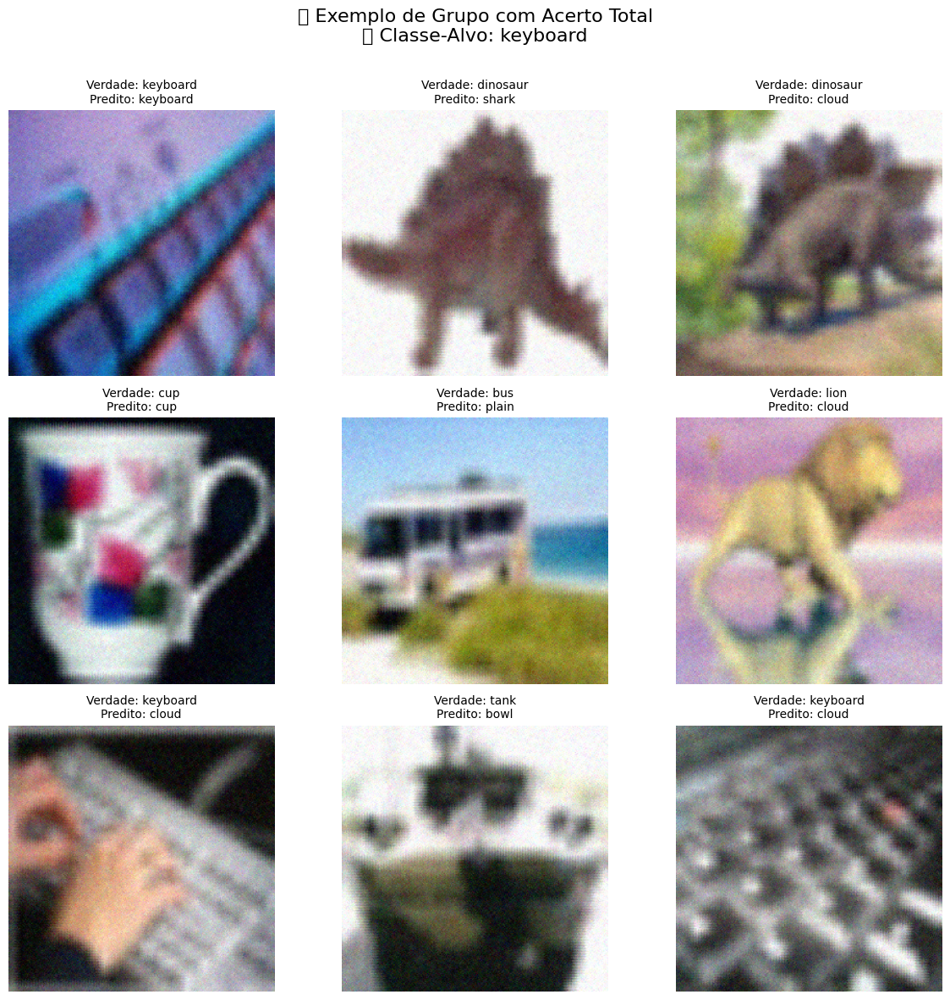

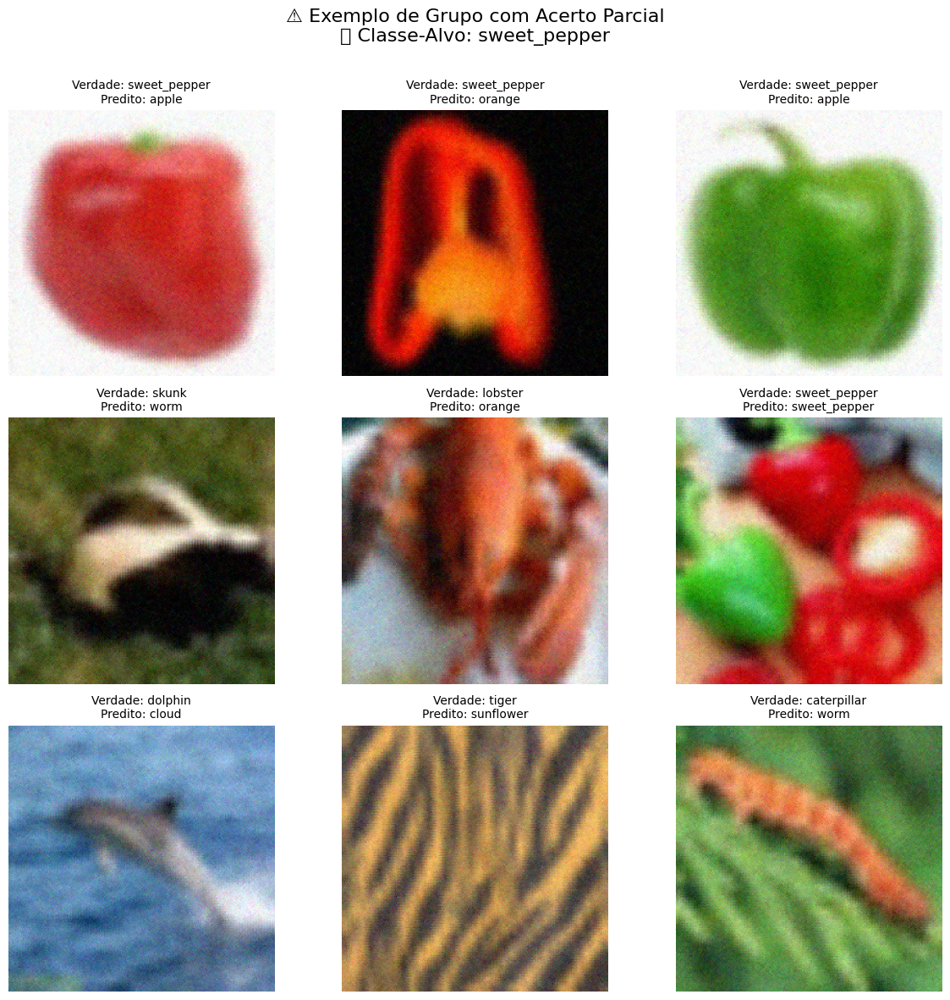

In [12]:
import os
import random
from glob import glob
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
from ultralytics import YOLO

# Novo diretório com imagens aumentadas
base_dir = '../datasets/cifar100/val_aug'

# Caminho para o modelo treinado salvo automaticamente
model_path = '../models/Yolo_Cifar.pt'

# Carregar o modelo
model = YOLO(model_path)

# Gera mapeamento: classe -> lista de imagens
class_to_imgs = {
    cls: glob(os.path.join(base_dir, cls, '*.*'))
    for cls in os.listdir(base_dir)
    if os.path.isdir(os.path.join(base_dir, cls))
}

# Remove classes com menos imagens que o mínimo desejado
min_class_images = 3
max_class_images = 4
eligible_classes = [cls for cls, imgs in class_to_imgs.items() if len(imgs) >= min_class_images]

print(f"Total de classes elegíveis: {len(eligible_classes)}")

# Lista global para armazenar exemplos
grupos_resultados = []

def mostrar_grupo_exemplo(grupo_data, classe_alvo=None, titulo="Grupo de Imagens"):
    """
    Mostra um grid com as imagens do grupo, indicando classe verdadeira e predição.
    Exibe também a classe-alvo do grupo.
    """
    imagens, preds, truths = grupo_data
    cols = 3
    rows = (len(imagens) + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))

    for i, img_path in enumerate(imagens):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(f"Verdade: {truths[i]}\nPredito: {preds[i]}", fontsize=10)
        plt.axis('off')

    suptitle = f"{titulo}"
    if classe_alvo:
        suptitle += f"\n🎯 Classe-Alvo: {classe_alvo}"

    plt.suptitle(suptitle, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)  # Ajuste para não sobrepor título
    plt.show()

def avaliar_grupos(n_execucoes=5, eval_trials=100, group_size=9):
    total_predictions_all = 0
    correct_predictions_all = 0
    total_grupos_all = 0

    acertos_grupo_total_all = 0
    acertos_grupo_parcial_all = 0
    erros_grupo_total_all = 0

    for exec_num in range(n_execucoes):
        print(f"\n🔁 Execução {exec_num + 1}/{n_execucoes}")
        for _ in tqdm(range(eval_trials), desc=f"Avaliação estatística #{exec_num + 1}"):
            chosen_class = random.choice(eligible_classes)
            max_allowed = min(max_class_images, group_size - 1)
            n_class_imgs = random.randint(min_class_images, max_allowed)

            main_class_imgs = random.sample(class_to_imgs[chosen_class], n_class_imgs)
            remaining_imgs = [img for cls, imgs in class_to_imgs.items() if cls != chosen_class for img in imgs if img not in main_class_imgs]
            other_imgs = random.sample(remaining_imgs, group_size - n_class_imgs)

            selected_imgs = main_class_imgs + other_imgs
            random.shuffle(selected_imgs)

            results = model.predict(source=selected_imgs, imgsz=256, device="cpu", verbose=False)

            grupo_class_total = 0
            grupo_class_acertos = 0

            grupo_imgs = []
            grupo_preds = []
            grupo_truths = []

            for path, r in zip(selected_imgs, results):
                true = os.path.basename(os.path.dirname(path))
                try:
                    pred = r.names[int(r.probs.top1)] if r.probs else "desconhecido"
                except:
                    pred = "erro"

                total_predictions_all += 1
                if pred == true:
                    correct_predictions_all += 1

                grupo_imgs.append(path)
                grupo_preds.append(pred)
                grupo_truths.append(true)

                if true == chosen_class:
                    grupo_class_total += 1
                    if pred == true:
                        grupo_class_acertos += 1

            total_grupos_all += 1
            if grupo_class_acertos == grupo_class_total:
                acertos_grupo_total_all += 1
                if len(grupos_resultados) < 1:
                    grupos_resultados.append(((grupo_imgs.copy(), grupo_preds.copy(), grupo_truths.copy()), chosen_class))
            elif grupo_class_acertos > 0:
                acertos_grupo_parcial_all += 1
                if len(grupos_resultados) < 2:
                    grupos_resultados.append(((grupo_imgs.copy(), grupo_preds.copy(), grupo_truths.copy()), chosen_class))
            else:
                erros_grupo_total_all += 1

    # Cálculos finais
    acc_imagem = correct_predictions_all / total_predictions_all
    acc_total = acertos_grupo_total_all / total_grupos_all
    acc_parcial = acertos_grupo_parcial_all / total_grupos_all
    erro_total = erros_grupo_total_all / total_grupos_all

    # Impressão final
    print("\n📊 Resultados numéricos (MÉDIA de 5 execuções):")
    print(f"🔹 Acurácia média por imagem: {acc_imagem:.2%} ({correct_predictions_all}/{total_predictions_all})")
    print(f"✅ Grupos com acerto total da classe-alvo: {acc_total:.2%} ({acertos_grupo_total_all}/{total_grupos_all})")
    print(f"⚠️ Grupos com acerto parcial da classe-alvo: {acc_parcial:.2%} ({acertos_grupo_parcial_all}/{total_grupos_all})")
    print(f"❌ Grupos com erro total da classe-alvo: {erro_total:.2%} ({erros_grupo_total_all}/{total_grupos_all})")

# Executar avaliação
avaliar_grupos(n_execucoes=5)

# Mostrar exemplos
if len(grupos_resultados) >= 1:
    grupo1, classe1 = grupos_resultados[0]
    mostrar_grupo_exemplo(grupo1, classe_alvo=classe1, titulo="✅ Exemplo de Grupo com Acerto Total")

if len(grupos_resultados) >= 2:
    grupo2, classe2 = grupos_resultados[1]
    mostrar_grupo_exemplo(grupo2, classe_alvo=classe2, titulo="⚠️ Exemplo de Grupo com Acerto Parcial")



# Treinamento Modelo YOLOv11 para Google Recaptcha V2

In [ ]:

modelGoogle = YOLO('yolo11n-cls.pt')
modelGoogle.train(
    data="GRv2P",
    epochs=200,
    imgsz=128,
    batch=64,
    patience=15,               
    workers=1,
    name='yolov11_google_super'
)

Total de classes elegíveis: 12

🔁 Execução 1/5


Avaliação estatística #1: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.80it/s]



🔁 Execução 2/5


Avaliação estatística #2: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 24.90it/s]



🔁 Execução 3/5


Avaliação estatística #3: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 24.94it/s]



🔁 Execução 4/5


Avaliação estatística #4: 100%|██████████████████████████████████████████████████████| 100/100 [00:03<00:00, 26.26it/s]



🔁 Execução 5/5


Avaliação estatística #5: 100%|██████████████████████████████████████████████████████| 100/100 [00:03<00:00, 26.22it/s]
C:\Users\joao_\AppData\Local\Temp\ipykernel_28084\2915557733.py:58: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\joao_\AppData\Local\Temp\ipykernel_28084\2915557733.py:58: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()



📊 Resultados numéricos (MÉDIA de 5 execuções):
🔹 Acurácia média por imagem: 74.24% (3341/4500)
✅ Grupos com acerto total da classe-alvo: 37.80% (189/500)
⚠️ Grupos com acerto parcial da classe-alvo: 51.40% (257/500)
❌ Grupos com erro total da classe-alvo: 10.80% (54/500)


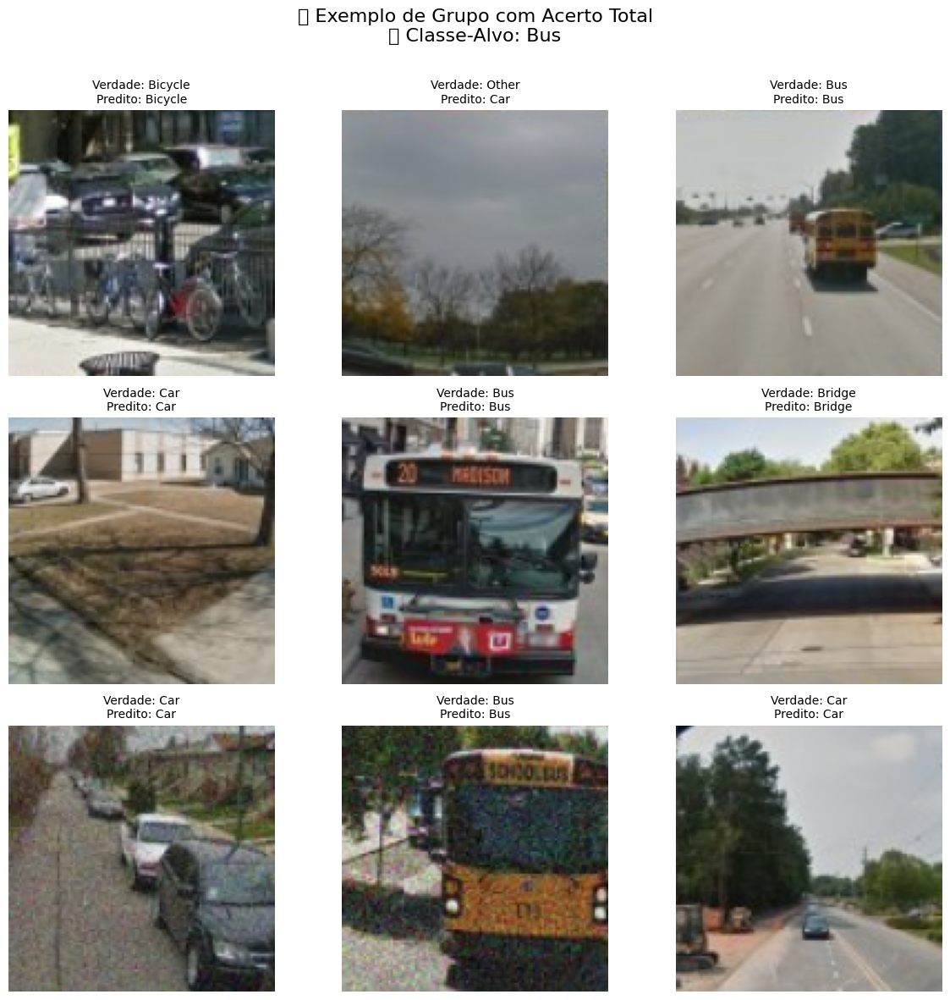

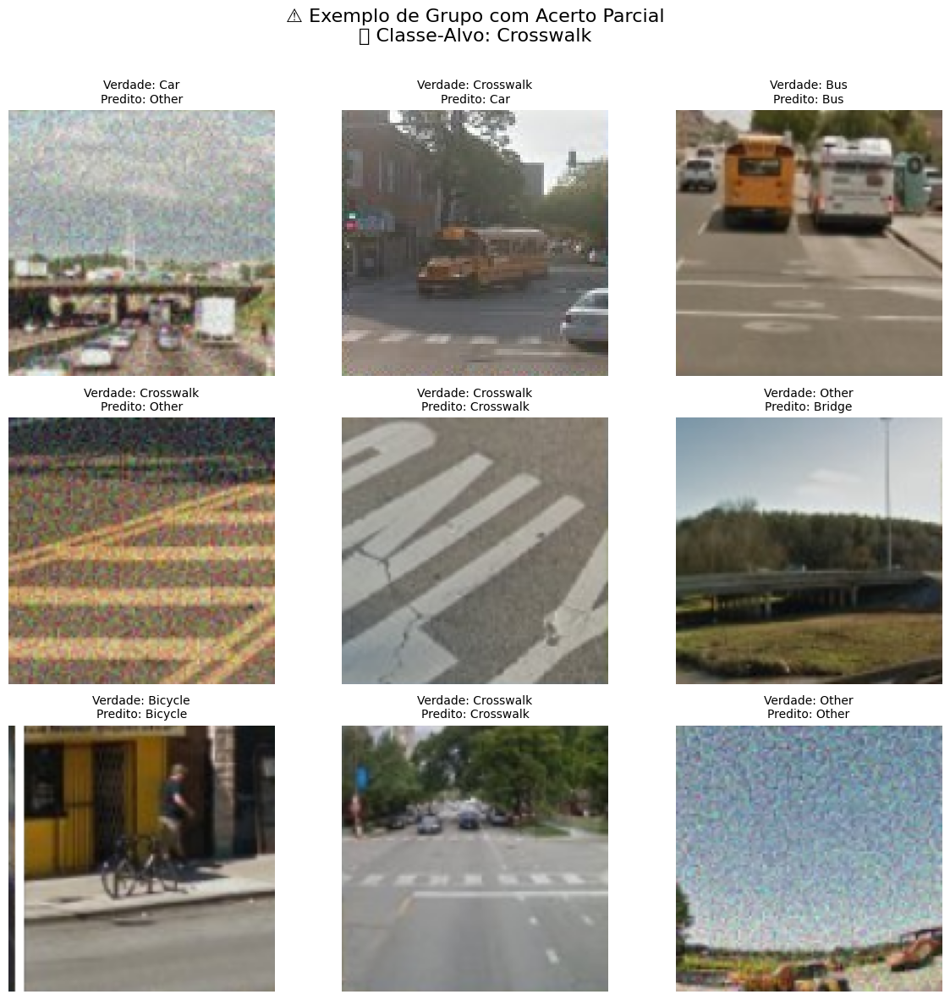

In [14]:
import os
import random
from glob import glob
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
from ultralytics import YOLO

# Novo diretório com imagens aumentadas
base_dir = '../datasets/GRv2P/val'

# Caminho para o modelo treinado salvo automaticamente
model_path = '../models/Yolo_Google.pt'

# Carregar o modelo
model = YOLO(model_path)

# Gera mapeamento: classe -> lista de imagens
class_to_imgs = {
    cls: glob(os.path.join(base_dir, cls, '*.*'))
    for cls in os.listdir(base_dir)
    if os.path.isdir(os.path.join(base_dir, cls))
}

# Remove classes com menos imagens que o mínimo desejado
min_class_images = 3
max_class_images = 4
eligible_classes = [cls for cls, imgs in class_to_imgs.items() if len(imgs) >= min_class_images]

print(f"Total de classes elegíveis: {len(eligible_classes)}")

# Lista global para armazenar exemplos
grupos_resultados = []

def mostrar_grupo_exemplo(grupo_data, classe_alvo=None, titulo="Grupo de Imagens"):
    """
    Mostra um grid com as imagens do grupo, indicando classe verdadeira e predição.
    Exibe também a classe-alvo do grupo.
    """
    imagens, preds, truths = grupo_data
    cols = 3
    rows = (len(imagens) + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))

    for i, img_path in enumerate(imagens):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(f"Verdade: {truths[i]}\nPredito: {preds[i]}", fontsize=10)
        plt.axis('off')

    suptitle = f"{titulo}"
    if classe_alvo:
        suptitle += f"\n🎯 Classe-Alvo: {classe_alvo}"

    plt.suptitle(suptitle, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)  # Ajuste para não sobrepor título
    plt.show()

def avaliar_grupos(n_execucoes=5, eval_trials=100, group_size=9):
    total_predictions_all = 0
    correct_predictions_all = 0
    total_grupos_all = 0

    acertos_grupo_total_all = 0
    acertos_grupo_parcial_all = 0
    erros_grupo_total_all = 0

    for exec_num in range(n_execucoes):
        print(f"\n🔁 Execução {exec_num + 1}/{n_execucoes}")
        for _ in tqdm(range(eval_trials), desc=f"Avaliação estatística #{exec_num + 1}"):
            chosen_class = random.choice(eligible_classes)
            max_allowed = min(max_class_images, group_size - 1)
            n_class_imgs = random.randint(min_class_images, max_allowed)

            main_class_imgs = random.sample(class_to_imgs[chosen_class], n_class_imgs)
            remaining_imgs = [img for cls, imgs in class_to_imgs.items() if cls != chosen_class for img in imgs if img not in main_class_imgs]
            other_imgs = random.sample(remaining_imgs, group_size - n_class_imgs)

            selected_imgs = main_class_imgs + other_imgs
            random.shuffle(selected_imgs)

            results = model.predict(source=selected_imgs, imgsz=256, device="cpu", verbose=False)

            grupo_class_total = 0
            grupo_class_acertos = 0

            grupo_imgs = []
            grupo_preds = []
            grupo_truths = []

            for path, r in zip(selected_imgs, results):
                true = os.path.basename(os.path.dirname(path))
                try:
                    pred = r.names[int(r.probs.top1)] if r.probs else "desconhecido"
                except:
                    pred = "erro"

                total_predictions_all += 1
                if pred == true:
                    correct_predictions_all += 1

                grupo_imgs.append(path)
                grupo_preds.append(pred)
                grupo_truths.append(true)

                if true == chosen_class:
                    grupo_class_total += 1
                    if pred == true:
                        grupo_class_acertos += 1

            total_grupos_all += 1
            if grupo_class_acertos == grupo_class_total:
                acertos_grupo_total_all += 1
                if len(grupos_resultados) < 1:
                    grupos_resultados.append(((grupo_imgs.copy(), grupo_preds.copy(), grupo_truths.copy()), chosen_class))
            elif grupo_class_acertos > 0:
                acertos_grupo_parcial_all += 1
                if len(grupos_resultados) < 2:
                    grupos_resultados.append(((grupo_imgs.copy(), grupo_preds.copy(), grupo_truths.copy()), chosen_class))
            else:
                erros_grupo_total_all += 1

    # Cálculos finais
    acc_imagem = correct_predictions_all / total_predictions_all
    acc_total = acertos_grupo_total_all / total_grupos_all
    acc_parcial = acertos_grupo_parcial_all / total_grupos_all
    erro_total = erros_grupo_total_all / total_grupos_all

    # Impressão final
    print("\n📊 Resultados numéricos (MÉDIA de 5 execuções):")
    print(f"🔹 Acurácia média por imagem: {acc_imagem:.2%} ({correct_predictions_all}/{total_predictions_all})")
    print(f"✅ Grupos com acerto total da classe-alvo: {acc_total:.2%} ({acertos_grupo_total_all}/{total_grupos_all})")
    print(f"⚠️ Grupos com acerto parcial da classe-alvo: {acc_parcial:.2%} ({acertos_grupo_parcial_all}/{total_grupos_all})")
    print(f"❌ Grupos com erro total da classe-alvo: {erro_total:.2%} ({erros_grupo_total_all}/{total_grupos_all})")

# Executar avaliação
avaliar_grupos(n_execucoes=5)

# Mostrar exemplos
if len(grupos_resultados) >= 1:
    grupo1, classe1 = grupos_resultados[0]
    mostrar_grupo_exemplo(grupo1, classe_alvo=classe1, titulo="✅ Exemplo de Grupo com Acerto Total")

if len(grupos_resultados) >= 2:
    grupo2, classe2 = grupos_resultados[1]
    mostrar_grupo_exemplo(grupo2, classe_alvo=classe2, titulo="⚠️ Exemplo de Grupo com Acerto Parcial")



Total de classes elegíveis: 12

🔁 Execução 1/5


Avaliação estatística #1: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 23.55it/s]



🔁 Execução 2/5


Avaliação estatística #2: 100%|██████████████████████████████████████████████████████| 100/100 [00:04<00:00, 24.38it/s]



🔁 Execução 3/5


Avaliação estatística #3: 100%|██████████████████████████████████████████████████████| 100/100 [00:03<00:00, 25.10it/s]



🔁 Execução 4/5


Avaliação estatística #4: 100%|██████████████████████████████████████████████████████| 100/100 [00:03<00:00, 25.73it/s]



🔁 Execução 5/5


Avaliação estatística #5: 100%|██████████████████████████████████████████████████████| 100/100 [00:03<00:00, 25.64it/s]
C:\Users\joao_\AppData\Local\Temp\ipykernel_28084\2997345919.py:58: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()



📊 Resultados numéricos (MÉDIA de 5 execuções):
🔹 Acurácia média por imagem: 40.04% (1802/4500)
✅ Grupos com acerto total da classe-alvo: 11.00% (55/500)
⚠️ Grupos com acerto parcial da classe-alvo: 47.00% (235/500)
❌ Grupos com erro total da classe-alvo: 42.00% (210/500)


C:\Users\joao_\AppData\Local\Temp\ipykernel_28084\2997345919.py:58: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


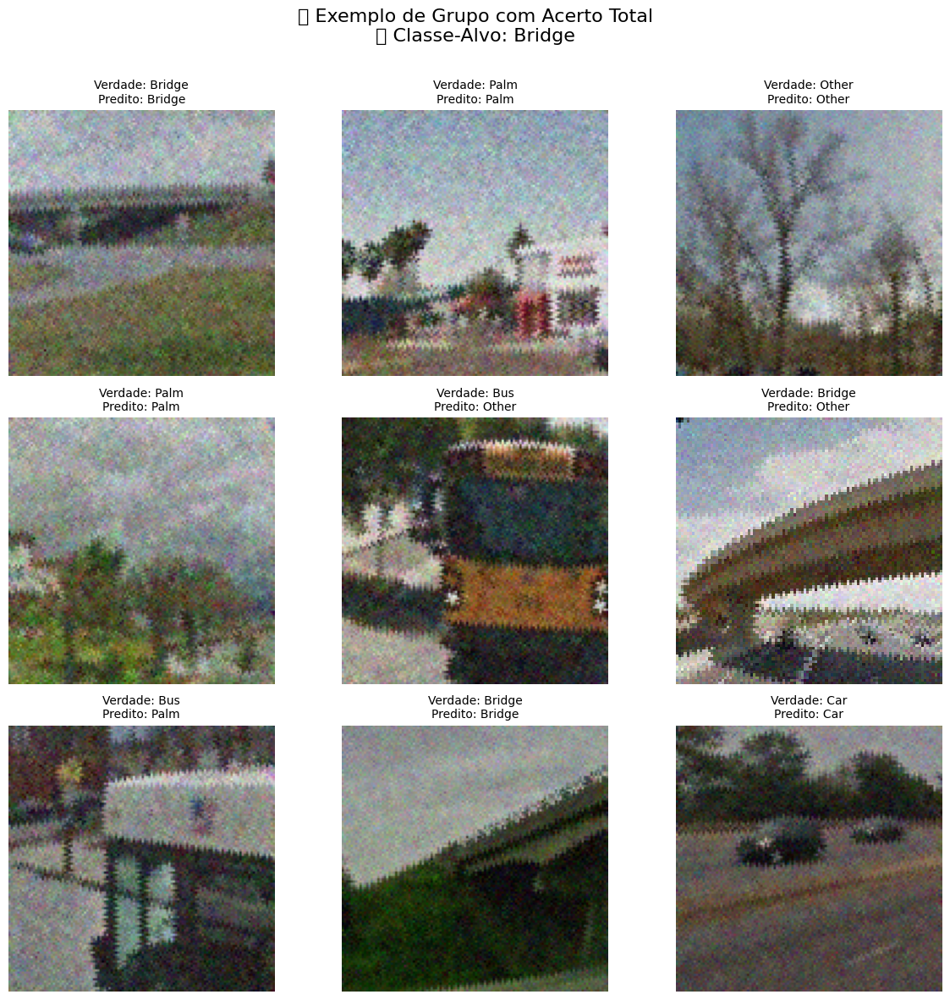

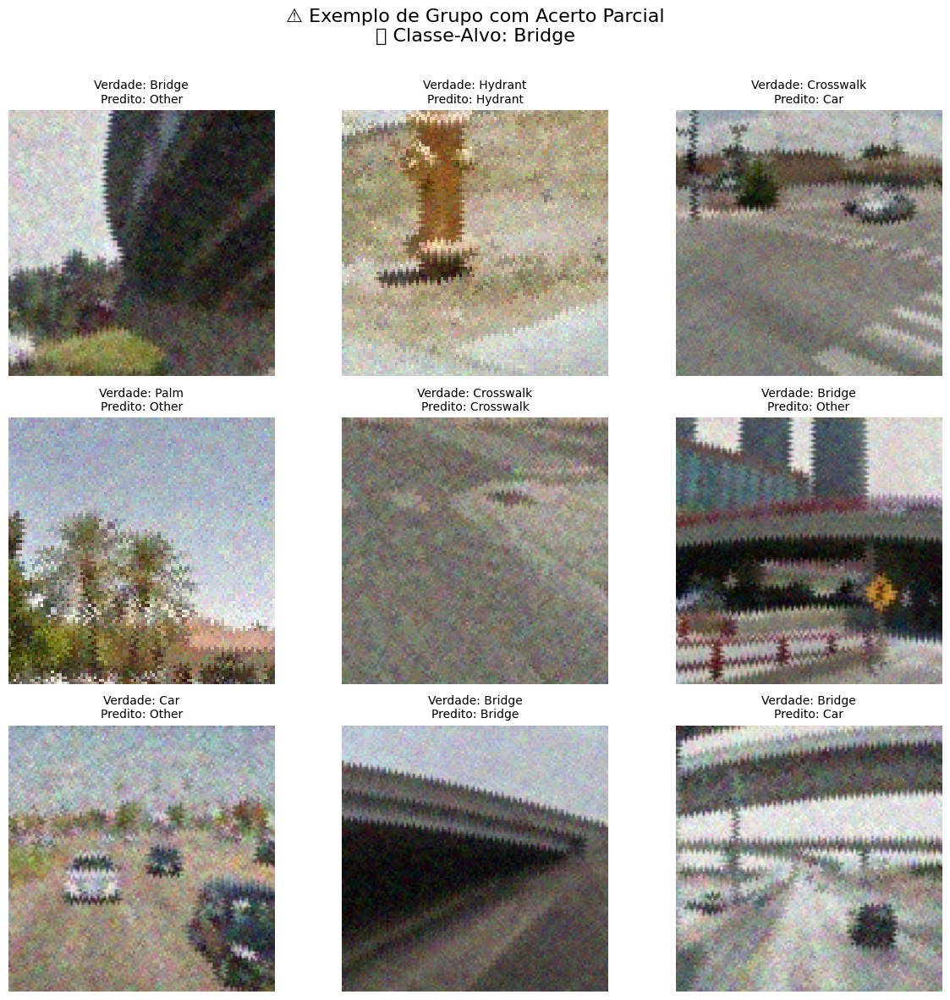

In [13]:
import os
import random
from glob import glob
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
from ultralytics import YOLO

# Novo diretório com imagens aumentadas
base_dir = '../datasets/GRv2P/val_aug'

# Caminho para o modelo treinado salvo automaticamente
model_path = '../models/Yolo_Google.pt'

# Carregar o modelo
model = YOLO(model_path)

# Gera mapeamento: classe -> lista de imagens
class_to_imgs = {
    cls: glob(os.path.join(base_dir, cls, '*.*'))
    for cls in os.listdir(base_dir)
    if os.path.isdir(os.path.join(base_dir, cls))
}

# Remove classes com menos imagens que o mínimo desejado
min_class_images = 3
max_class_images = 4
eligible_classes = [cls for cls, imgs in class_to_imgs.items() if len(imgs) >= min_class_images]

print(f"Total de classes elegíveis: {len(eligible_classes)}")

# Lista global para armazenar exemplos
grupos_resultados = []

def mostrar_grupo_exemplo(grupo_data, classe_alvo=None, titulo="Grupo de Imagens"):
    """
    Mostra um grid com as imagens do grupo, indicando classe verdadeira e predição.
    Exibe também a classe-alvo do grupo.
    """
    imagens, preds, truths = grupo_data
    cols = 3
    rows = (len(imagens) + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))

    for i, img_path in enumerate(imagens):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(f"Verdade: {truths[i]}\nPredito: {preds[i]}", fontsize=10)
        plt.axis('off')

    suptitle = f"{titulo}"
    if classe_alvo:
        suptitle += f"\n🎯 Classe-Alvo: {classe_alvo}"

    plt.suptitle(suptitle, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)  # Ajuste para não sobrepor título
    plt.show()

def avaliar_grupos(n_execucoes=5, eval_trials=100, group_size=9):
    total_predictions_all = 0
    correct_predictions_all = 0
    total_grupos_all = 0

    acertos_grupo_total_all = 0
    acertos_grupo_parcial_all = 0
    erros_grupo_total_all = 0

    for exec_num in range(n_execucoes):
        print(f"\n🔁 Execução {exec_num + 1}/{n_execucoes}")
        for _ in tqdm(range(eval_trials), desc=f"Avaliação estatística #{exec_num + 1}"):
            chosen_class = random.choice(eligible_classes)
            max_allowed = min(max_class_images, group_size - 1)
            n_class_imgs = random.randint(min_class_images, max_allowed)

            main_class_imgs = random.sample(class_to_imgs[chosen_class], n_class_imgs)
            remaining_imgs = [img for cls, imgs in class_to_imgs.items() if cls != chosen_class for img in imgs if img not in main_class_imgs]
            other_imgs = random.sample(remaining_imgs, group_size - n_class_imgs)

            selected_imgs = main_class_imgs + other_imgs
            random.shuffle(selected_imgs)

            results = model.predict(source=selected_imgs, imgsz=256, device="cpu", verbose=False)

            grupo_class_total = 0
            grupo_class_acertos = 0

            grupo_imgs = []
            grupo_preds = []
            grupo_truths = []

            for path, r in zip(selected_imgs, results):
                true = os.path.basename(os.path.dirname(path))
                try:
                    pred = r.names[int(r.probs.top1)] if r.probs else "desconhecido"
                except:
                    pred = "erro"

                total_predictions_all += 1
                if pred == true:
                    correct_predictions_all += 1

                grupo_imgs.append(path)
                grupo_preds.append(pred)
                grupo_truths.append(true)

                if true == chosen_class:
                    grupo_class_total += 1
                    if pred == true:
                        grupo_class_acertos += 1

            total_grupos_all += 1
            if grupo_class_acertos == grupo_class_total:
                acertos_grupo_total_all += 1
                if len(grupos_resultados) < 1:
                    grupos_resultados.append(((grupo_imgs.copy(), grupo_preds.copy(), grupo_truths.copy()), chosen_class))
            elif grupo_class_acertos > 0:
                acertos_grupo_parcial_all += 1
                if len(grupos_resultados) < 2:
                    grupos_resultados.append(((grupo_imgs.copy(), grupo_preds.copy(), grupo_truths.copy()), chosen_class))
            else:
                erros_grupo_total_all += 1

    # Cálculos finais
    acc_imagem = correct_predictions_all / total_predictions_all
    acc_total = acertos_grupo_total_all / total_grupos_all
    acc_parcial = acertos_grupo_parcial_all / total_grupos_all
    erro_total = erros_grupo_total_all / total_grupos_all

    # Impressão final
    print("\n📊 Resultados numéricos (MÉDIA de 5 execuções):")
    print(f"🔹 Acurácia média por imagem: {acc_imagem:.2%} ({correct_predictions_all}/{total_predictions_all})")
    print(f"✅ Grupos com acerto total da classe-alvo: {acc_total:.2%} ({acertos_grupo_total_all}/{total_grupos_all})")
    print(f"⚠️ Grupos com acerto parcial da classe-alvo: {acc_parcial:.2%} ({acertos_grupo_parcial_all}/{total_grupos_all})")
    print(f"❌ Grupos com erro total da classe-alvo: {erro_total:.2%} ({erros_grupo_total_all}/{total_grupos_all})")

# Executar avaliação
avaliar_grupos(n_execucoes=5)

# Mostrar exemplos
if len(grupos_resultados) >= 1:
    grupo1, classe1 = grupos_resultados[0]
    mostrar_grupo_exemplo(grupo1, classe_alvo=classe1, titulo="✅ Exemplo de Grupo com Acerto Total")

if len(grupos_resultados) >= 2:
    grupo2, classe2 = grupos_resultados[1]
    mostrar_grupo_exemplo(grupo2, classe_alvo=classe2, titulo="⚠️ Exemplo de Grupo com Acerto Parcial")

